In [304]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from scipy.fft import fft
from scipy.signal import correlate, find_peaks
from scipy.spatial.distance import euclidean, cdist
from scipy.spatial.transform import Rotation

from fastdtw import fastdtw
from pyts.decomposition import SingularSpectrumAnalysis as ssa

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_auc_score, RocCurveDisplay
from sklearn.model_selection import train_test_split

from tslearn.metrics import dtw_path
from tslearn.clustering import TimeSeriesKMeans, silhouette_score as ts_silhouette_score

from xgboost import XGBClassifier

import time 

## Introduction
### GOAL: Identify number of gestures during each body motion, and attempt to classify them as well. 

### Initial thoughts from instructions
* Body motion will be a method by which we will separate data. We want to identify number of gestures/classification <i> within </i> each body motion, not regardless of body motion.
* This project will require unsupervised learning techniques, since it appears we don't know what is a gesture, or even how many we have.
* Quaternion and accelerometer/gyroscope data have different axis.The quaternion appears to be negative of the other values.
* I'm unfamiliar with quaternion/gyroscope processing, so let's look a bit into that as well.


### Pipeline of expected steps to address our problems

Step 1: Look at raw data to get an idea of what we are working with.

Step 2: Create a dataset where each row corresponds to a sample. Currently time is our index but need to switch to some broader dynamics, since we have time-series components and that can provide contextual information. Ideally each sample would be a gesture, but we have to identify what a "gesture" is.

Step 3: Augument dataset. We can abstract properties from the time series dataset into frequency domains or other components that we can look into later. 
Ideally through this augmentation we can find some deeper higher dimensional properties that allow us to group things easier.

Step 4: Perform decomposition of our dataset to see if we can observe clustering of different groups, which might hint at different gestures.

Step 5: Attempt to classify different groups.

In [2]:
#Obtained from the take home exam information, Load Data
col_names = ['Time (ms)','Channel 0 Raw','Channel 1 Raw','Channel 0 HP',
            'Channel 1 HP','Quaternion x','Quaternion y','Quaternion z',
            'Quaternion w','Gyroscope x (deg/s)','Gyroscope y (deg/s)',
            'Gyroscope z (deg/s)','Accelerometer x (m2/s)','Accelerometer y (m2/s)',
            'Accelerometer z (m2/s)','Body movement label','Repetition number']
body_movement_dict = {'standing 1': 0,'standing 2':1,'walking':2,'walking fast':3,'running':4}

df = pd.read_csv('~/Downloads/pison_data_interview.csv',header= None, names=col_names) #load data

# Some Initial Exploration

In [3]:
df.isna().sum()

Time (ms)                 0
Channel 0 Raw             0
Channel 1 Raw             0
Channel 0 HP              0
Channel 1 HP              0
Quaternion x              0
Quaternion y              0
Quaternion z              0
Quaternion w              0
Gyroscope x (deg/s)       0
Gyroscope y (deg/s)       0
Gyroscope z (deg/s)       0
Accelerometer x (m2/s)    0
Accelerometer y (m2/s)    0
Accelerometer z (m2/s)    0
Body movement label       0
Repetition number         0
dtype: int64

In [4]:
#Visualize data
def plot_wearable(df,wearable_name,my_ax = None,z_score = True, other_traces = True,min_max = False):
    """_Plot a column of data against time, while representing repetition number and body movement

    Args:
        df (pd.DataFrame): contains the wearable dataset as well as time, body movement, and repetition number
        wearable_name (str): Name of column in dataframe to plot
        my_ax (axes, optional): handle to plot the figure on. Defaults to None.
        z_score (bool, optional): Z-score the time series to plot. Defaults to True.
        other_traces (bool, optional): Plot body movement and repetition number on the same axes. Defaults to True.
        min_max (bool, optional): min-max the time series to plot. Defaults to False.
    """

    time = df['Time (ms)']
    wearable = df[wearable_name]

    n_str = ''
    if z_score:
        n_str = 'Z-scored '
        wearable = StandardScaler().fit_transform(wearable.values.reshape(-1,1))
    
    if min_max:
        n_str = 'Min-Maxed '
        wearable = MinMaxScaler().fit_transform(wearable.values.reshape(-1,1))
    
    if my_ax == None: #if no axes passes, create new one
        my_ax = plt.axes()

    my_ax.plot(time,wearable,color = 'black') #z-score data for easier visualization
    
    if other_traces:
        body_movement = df['Body movement label'] 
        rep_num = df['Repetition number']
        my_ax.plot(time,body_movement,color = 'red') #plot the body_movement
        my_ax.scatter(time,np.ones(time.shape)*np.max(wearable),c= rep_num) #plot the rep number

    plt.setp(my_ax,xlabel = 'Time (ms)',ylabel = n_str + wearable_name)

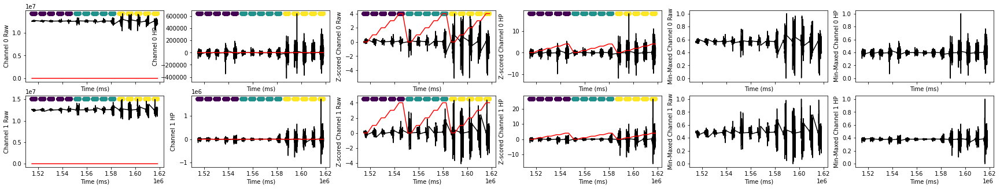

In [5]:
_,all_ax = plt.subplots(ncols= 6, nrows=2,sharex= True,figsize = (30,5))

plot_wearable(df,'Channel 0 Raw',my_ax = all_ax[0][0],z_score = False)
plot_wearable(df,'Channel 0 HP',my_ax = all_ax[0,1],z_score = False)
plot_wearable(df,'Channel 1 Raw',my_ax = all_ax[1,0],z_score = False)
plot_wearable(df,'Channel 1 HP',my_ax = all_ax[1,1],z_score = False)

plot_wearable(df,'Channel 0 Raw',my_ax = all_ax[0][2],z_score = True)
plot_wearable(df,'Channel 0 HP',my_ax = all_ax[0,3],z_score = True)
plot_wearable(df,'Channel 1 Raw',my_ax = all_ax[1,2],z_score = True)
plot_wearable(df,'Channel 1 HP',my_ax = all_ax[1,3],z_score = True)

plot_wearable(df,'Channel 0 Raw',my_ax = all_ax[0][4],min_max = True,other_traces = False,z_score = False)
plot_wearable(df,'Channel 0 HP',my_ax = all_ax[0,5],min_max = True,other_traces = False,z_score = False)
plot_wearable(df,'Channel 1 Raw',my_ax = all_ax[1,4],min_max = True,other_traces = False,z_score = False)
plot_wearable(df,'Channel 1 HP',my_ax = all_ax[1,5],min_max = True,other_traces = False,z_score = False)

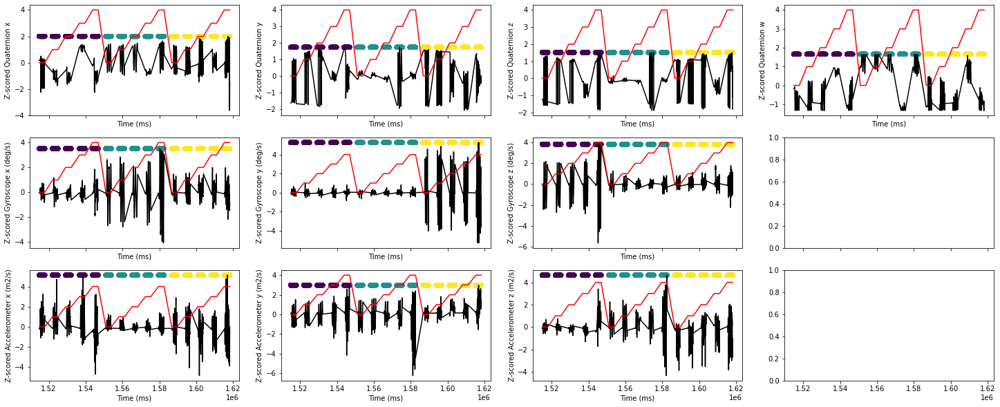

In [6]:
_,all_ax = plt.subplots(ncols= 4, nrows=3,sharex= True,figsize = (25,10))

plot_wearable(df,'Quaternion x',my_ax = all_ax[0,0])
plot_wearable(df,'Quaternion y',my_ax = all_ax[0,1])
plot_wearable(df,'Quaternion z',my_ax = all_ax[0,2])
plot_wearable(df,'Quaternion w',my_ax = all_ax[0,3])

plot_wearable(df,'Gyroscope x (deg/s)',my_ax = all_ax[1,0])
plot_wearable(df,'Gyroscope y (deg/s)',my_ax = all_ax[1,1])
plot_wearable(df,'Gyroscope z (deg/s)',my_ax = all_ax[1,2])

plot_wearable(df,'Accelerometer x (m2/s)',my_ax = all_ax[2,0])
plot_wearable(df,'Accelerometer y (m2/s)',my_ax = all_ax[2,1])
plot_wearable(df,'Accelerometer z (m2/s)',my_ax = all_ax[2,2])

There is a lot of variability in the values in the sensor data and in the gyroscope data. Either through these reptitions there are some gesture motions that were not present in the previous trials. 

<b>Some Initial Findings</b>:

* The repetition number also has some jumps, which is weird since we didn't have any NANs. So let's look at the time axis a bit more intensely to see what's going on.

* Although MinMaxing or Z-Scoring don't show many differences I'm going to opt for Z-scoring since it preserves different sensors' scales and preserves some outlier information.

* Time does not begin at 0, so we can fix this.

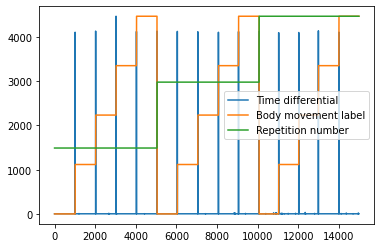

In [7]:
plt.plot(np.diff(df['Time (ms)']))  
plt.plot(df['Body movement label']*np.max(np.diff(df['Time (ms)']))/4)
plt.plot(df['Repetition number']*np.max(np.diff(df['Time (ms)']))/3)
plt.legend(['Time differential','Body movement label','Repetition number'])

Although the dataset appears continuous, there are large time jumps in the dataset, implying that it's not a continuous recording. The index at which the body movement changes corresponds to the index at which the time becomes asynchronous so we can segment by body movement index differential. Let's find these time points for later use.

In [8]:
def reset_time(df,time_col = 'Time (ms)'):
    """Reset the time axis so that the first sample is at time 0

    Args:
        df (pandas.DataFrame): DataFrame containing the time axis
        time_col (str, optional): name for the time column. Defaults to 'Time (ms)'.

    Returns:
        pandas.DataFrame: DataFrame with reset time axis
    """
    df[time_col] = df[time_col] - df.loc[0,time_col]
    return df

In [9]:
def identify_async_indx(df):
    """Identify the indices where the signal "jumps" in time based on body movement label. It's easier than with time, since it's at non-zero values.
    If this was different, we could just find peaks of the differential, but let's make it easy for us now.

    Args:
        df (pandas.DataFrame): Dataframe containing the body movement label which we have identified matches with periods of asynchronicity.

    Returns:
        list: contains the indices of time jumps, as well as -1 at the beginning and the last sample to ensure that all our time chunks are well segmented.
    """
    indx_jump = np.argwhere(np.diff(df['Body movement label'])!=0).flatten() #last index of the sample corresponding to a particular body movement
    indx_jump = np.insert(indx_jump,0,-1) #add at the beginning the index -1, since the first segment begins at 0
    indx_jump = np.append(indx_jump,len(df)) #add at the end the last sample

    return indx_jump

In [10]:
def normalize_data(df,col,scaling = 'z-score'):
    """_summary_

    Args:
        df (pandas.DataFrame): DataFrame containing the values to scale
        col (str): column name to scale
        scaling (str, optional): Scaling type. Defaults to 'z-score'.

    Returns:
        pandas.DataFrame: DataFrame containing the scaled values within the same column
    """
    if scaling == 'z-score':
        df[col] = StandardScaler().fit_transform(df[col].values.reshape(-1,1))
    elif scaling == 'min-max':
        df[col] = MinMaxScaler().fit_transform(df[col].values.reshape(-1,1))
    else:
        print('No scaling applied')
    return df
    

Segment data allows us to segment our time series into a variable number of chunks of time, so we can perform further data exploration for variable sizes. The assumption here is that each gesture last a certain amount of time, which is less than a whole body positioning (i.e., you're not going to walk the entire time flexing your wrist), but larger than 1 sample. 

In [11]:
def segment_data(df,win_indx, segment_size = 50):
    """Segregate dataframe into subwindows within continuous data streams.

    Args:
        df (pandas.DataFrame): Dataframe containing all traces of data to segment
        win_indx (list): List of time points corresponding to the last index before a transition point in the time domain
        segment_size (int, optional): Size of the window to segment data. Defaults to 50.

    Returns:
        pandas.DataFrame: DataFrame where each row corresponds to a segmentation, and each column is an array of the values segmented
    """
    seg_df = {}
    for col in df.columns: #iterate through all columns (different features to possibly explore)
        win_vals = []
        for start_indx,end_indx in zip(win_indx[:-1],win_indx[1:]): #iterate through all continuous time series data points
            df_win = df.iloc[start_indx+1:end_indx].copy().reset_index() #first, we are going to window just within the body motion to ensure that we don't capture other body motion datapoints
            df_win['win_id'] = np.arange(len(df_win))//segment_size + 1 #create a new column, corresponding to the window id for this section, in order to efficiently group by
    
            if col in ['Body movement label','Repetition number']:
                #since we saw from the figure above that the transition points match with the transitions of these labels, each window should have only one of these labels
                win_vals.extend(df_win.groupby('win_id')[col].apply(lambda x: np.unique(x)[0]).values)
            else:
                win_vals.extend(df_win.groupby('win_id')[col].apply(np.array).values)
       
        seg_df[col] = win_vals

    seg_df = pd.DataFrame(seg_df) #turn dictionary into dataframe
    seg_df['num_samples'] = seg_df['Time (ms)'].apply(len) #for information purposes, return the number of samples per each window 

    return seg_df


In [12]:
def estimate_sampling_rate(df,async_indx):
    """Estimate sampling rate. Since dataframe has asynchronous periods, we need to ignore those time points.

    Args:
        df (pandas.DataFrame): DataFrame containing time data
        async_indx (list): indices corresponding to the periods where traces become asynchronous

    Returns:
        scalar: Estimated sampling rate in Hz
    """
    tmp = segment_data(df,async_indx,segment_size = 1e10) #a very large window ensures that only one window per continuous period
    fs_indx = []
    for seg_id in range(len(tmp)):
        fs_indx.append(np.mean(np.diff(tmp.loc[seg_id,'Time (ms)'])))
    return 1/np.mean(fs_indx)*1000 #scale from ms to s

In [13]:
async_indx = identify_async_indx(df)
seg_df = segment_data(df,async_indx,1e10)
fs = estimate_sampling_rate(df,async_indx)
print(f'Sampling rate: {fs} Hz')


Sampling rate: 330.1367457906395 Hz


## Visualize 3D Motion

### Quaternion Dataset
Let's look into how to process quaternion data to visualize motions

1) What is a quaternion system?
2) How do we structure it into a familiar system? (i.e., rotational matrices, Euler's,etc...)
3) Do we need to transform it since the instructions have it pointing in a different direction than the gyroscope and accelerometer?

To begin, let's just look at each body positioning/trial, so the default "time segentations".


References:

[Info into quaternions](https://en.wikipedia.org/wiki/Quaternion)\
[Transformations from quaternions](https://stackoverflow.com/questions/60420607/plotting-3d-vector-in-matplotlib-using-a-position-and-a-quaternion)\
[Transformations into Euler's](https://en.wikipedia.org/wiki/Euler_angles#Definition_by_intrinsic_rotations:~:text=The%20three%20elemental%20rotations%20may,frame%20after%20each%20elemental%20rotation)\
[Toolset into transformations](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.transform.Rotation.html)


In [14]:
def quat_to_euler(df,quaternion_names = ['Quaternion x','Quaternion y','Quaternion z','Quaternion w']):
    """Transform our Quaternion data into Euler rotational  positioning for easier understanding.

    Args:
        df (pandas.DataFrame): Dataframe containing the quaternion data, to add the new Euler rotational data
        quaternion_names (list, optional): Names of the quaternion columns. Defaults to ['Quaternion x','Quaternion y','Quaternion z','Quaternion w'].

    Returns:
        pandas.DataFrame: DataFrame with the removed quaternion columns with the new Euler columns
    """

    
    r = Rotation.from_quat(df[quaternion_names])
    euler_transform = r.as_euler('xyz')
    euler_transform[:,0:2] = euler_transform[:,0:2] * -1 #multiply x and y by -1 since they point West and South, opposite of the gyroscope and accelerometer

    df[['Euler_x','Euler_y','Euler_z']] = euler_transform

    return df
    

In [15]:
def vis_euler3D(df,euler_names = ['Euler_x','Euler_y','Euler_z'],color = None, change_color = True,ax_handle = None):
    """Visualize Euler Positioning in 3D space.

    Args:
        df (pandas.DataFrame): dataframe containing the euler positionings.
        euler_names (list, optional): column names (x,y,z). Defaults to ['Euler_x','Euler_y','Euler_z'].
        color (tuple, optional): input for scatter for the color to use. Defaults to None.
        change_color (bool, optional): Whether to have the trace change color across the line. Defaults to True.
        ax_handle (plt.axes, optional): axes handle to plot onto. Defaults to None.
    """
    euler_x =df[euler_names[0]] 
    euler_y =df[euler_names[1]] 
    euler_z =df[euler_names[2]] 

    if ax_handle == None:
        plt.figure(figsize = (20,10))
        this_ax = plt.axes(projection = '3d')
    else:
        this_ax = ax_handle

    plt.setp(this_ax,'xlim',[np.min(euler_x),np.max(euler_x)],'ylim',[np.min(euler_y),np.max(euler_y)],'zlim',[np.min(euler_z),np.max(euler_z)],
            'xlabel','East-West','ylabel','North-South','zlabel','Up-Down')

    if color:
        color_pal = color
    elif change_color:
        max_val = euler_x.shape[0]
        color_pal = [(i/max_val, 0, (max_val - i) / max_val) for i in range(max_val)]
    else:
        color_pal = [1,0,0]

    this_ax.scatter(euler_x,euler_y,euler_z,color = color_pal)  

In [16]:
tmp_df = df.copy()

async_indx = identify_async_indx(tmp_df)
tmp_df = quat_to_euler(tmp_df)
seg_df = segment_data(tmp_df,async_indx,1e10)

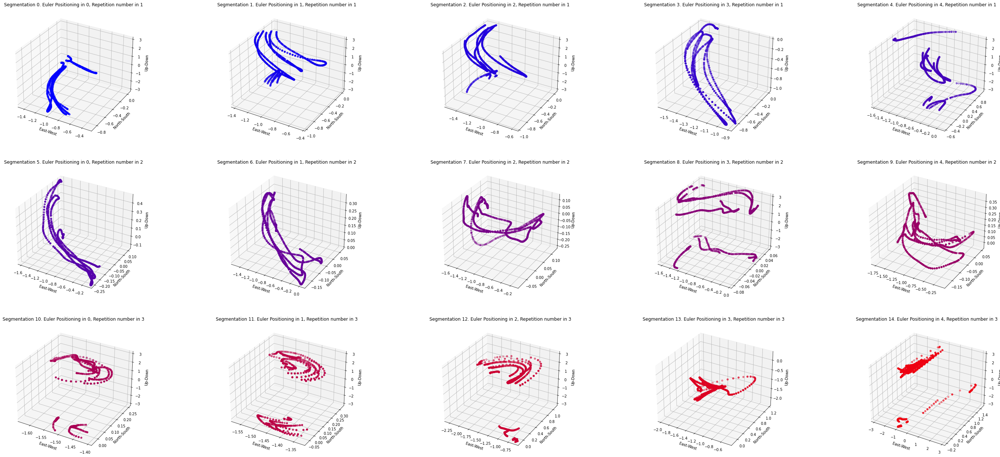

In [17]:
plt.figure(figsize = (50,30))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1,projection = '3d')
    vis_euler3D(seg_df.iloc[ii],ax_handle = ax_handle,color = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]])
    plt.title(f'Segmentation {ii}. Euler Positioning in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')


### Quaternion Conclusions
Quaternion/Euler positionings:

* Looks like trial 3,5, and 6 show similar wrist positioning. <U> Looks like some up/down motion </u>
* Looks like trial 10,11,12 have simliar wrist positioning. <u> Circular motion </u>
* Looks like trial 1,2 (maybe 0?) have similar wrist positioning. 

* Trial 14 might show some similarities to 10/11/12 but at a different angle.

* Trial 4,8, and 9 have some wide range varieties of motion. 



### Accelerometer Dataset
Looks like Quaternion data is derived from Accelerometer/Gyorscope data. 

* References:\
[Sample code](https://github.com/xioTechnologies/Gait-Tracking-With-x-IMU/blob/master/Gait%20Tracking%20With%20x-IMU/Script.m)\
[Mathematical Algorithms](https://ahrs.readthedocs.io/en/latest/filters/aqua.html)


However, let's visualize some of this data independently to see if we can also find other patterns within it

In [18]:
def vis_accel3D(df,accel_names = ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'] ,color = None, change_color = True,ax_handle = None):
    """Visualize a 3 dimensional trace of the accelerometers across all 3 axes.

    Args:
        df (pandas.DataFrame): dataframe containing the accelerometer traces.
        accel_names (list, optional): column names (x,y,z). Defaults to ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'].
        color (tuple, optional): input for scatter for the color to use. Defaults to None.
        change_color (bool, optional): Whether to have the trace change color across the line. Defaults to True.
        ax_handle (plt.axes, optional): axes handle to plot onto. Defaults to None.
    """
    
    accel_x =df[accel_names[0]] 
    accel_y =df[accel_names[1]] 
    accel_z =df[accel_names[2]] 

    if ax_handle == None:
        plt.figure(figsize = (20,10))
        this_ax = plt.axes(projection = '3d')
    else:
        this_ax = ax_handle

    plt.setp(this_ax,'xlim',[np.min(accel_x),np.max(accel_x)],'ylim',[np.min(accel_y),np.max(accel_y)],'zlim',[np.min(accel_z),np.max(accel_z)],
            'xlabel','East-West','ylabel','North-South','zlabel','Up-Down')

    if color:
        color_pal = color
    elif change_color:
        max_val = accel_x.shape[0]
        color_pal = [(i/max_val, 0, (max_val - i) / max_val) for i in range(max_val)]
    else:
        color_pal = [1,0,0]

    this_ax.plot3D(accel_x,accel_y,accel_z,color = color_pal) 

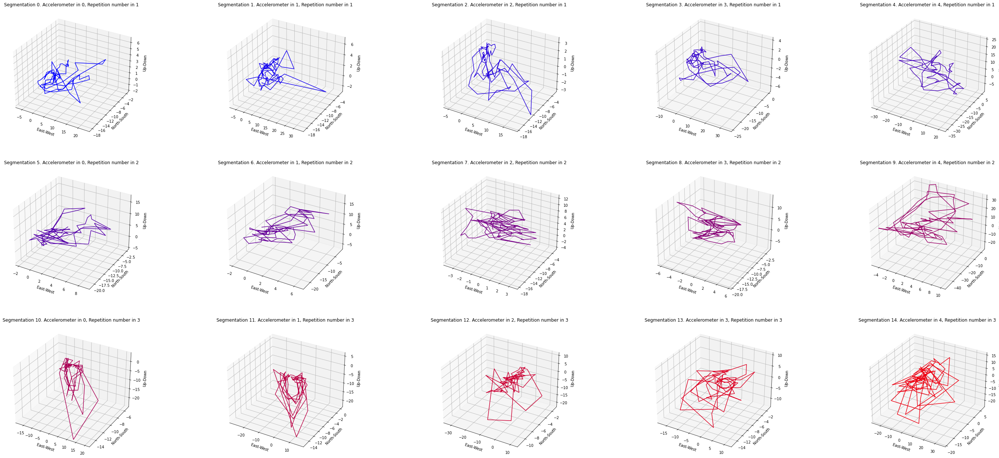

In [19]:
plt.figure(figsize = (50,30))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1,projection = '3d')
    vis_accel3D(seg_df.iloc[ii],ax_handle = ax_handle,color = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]])
    plt.title(f'Segmentation {ii}. Accelerometer in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')



Not very useful to look at 3D, but we had to try. Let's look at it in 1D.

In [20]:
def vis_accel1D(df,accel_names = ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'] ,color = None, change_color = True,ax_handle = None):
    """Visualize an accelerometer trace combining all 3 axes into a single accelerometer magnitude.

    Args:
        df (pandas.DataFrame): dataframe containing the accelerometer traces.
        accel_names (list, optional): column names (x,y,z). Defaults to ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'].
        color (tuple, optional): input for scatter for the color to use. Defaults to None.
        change_color (bool, optional): Whether to have the trace change color across the line. Defaults to True.
        ax_handle (plt.axes, optional): axes handle to plot onto. Defaults to None.
    """
    
    accel_x =df[accel_names[0]] 
    accel_y =df[accel_names[1]] 
    accel_z =df[accel_names[2]] 

    tot_acc = np.sqrt(accel_x**2 + accel_y**2 + accel_z**2)

    if ax_handle == None:
        plt.figure(figsize = (20,10))
        this_ax = plt.axes()
    else:
        this_ax = ax_handle

    plt.setp(this_ax,'ylim',[-1*np.max(tot_acc),np.max(tot_acc)], 'xlabel','Time (s)')

    if color:
        color_pal = color
    elif change_color:
        max_val = tot_acc.shape[0]
        color_pal = [(i/max_val, 0, (max_val - i) / max_val) for i in range(max_val)]
    else:
        color_pal = [1,0,0]

    t_vec = (df['Time (ms)'] - df['Time (ms)'][0])/1000
    this_ax.plot(t_vec,tot_acc,color = color_pal) 

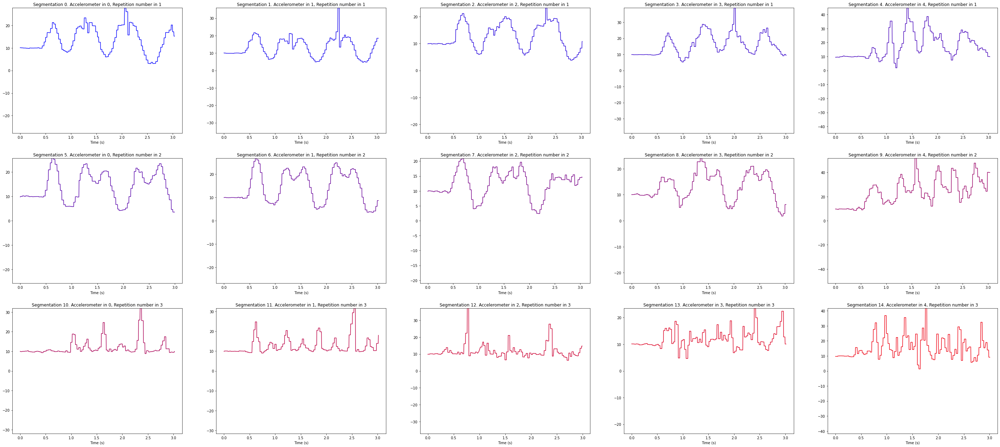

In [21]:
plt.figure(figsize = (50,30))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1)
    vis_accel1D(seg_df.iloc[ii],ax_handle = ax_handle,color = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]])
    plt.title(f'Segmentation {ii}. Accelerometer in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')


### Accelerometer Conclusions
* For Repetition 1, it appears that there are 4 cycles (except for the segmentation 2) of all data. Maybe segmentation 4 has 5 cycles. Could this be 5 motions?
* For Repetition 2, it appears that there is 3 cycles. Except for segmentation 4 which has ~6?
* For Repetition 3, data appears mover varied. \
    ** Segmentation 10 (4 cycles)\
    ** Segmentation 11 (~8 cycles). However, it's interesting that it seems to alternate between high oscillations and low oscillations. 2 gestures?\
    ** Segmentation 12 and 13 have some interesting patterns that are difficult to figure out.\
    ** Segmentation 14 (~8 cycles)\

## Visualize Sensor Traces

Let's look at the traces to see if we can glean information from them.


In [22]:
def vis_sensors_filt(df,accel_names = ['Channel 0 HP','Channel 1 HP'] ,color1 = None,color2 = None, change_color = True,ax_handle = None):
    """Visualize the sensor traces for both channels for the high pass traces.

    Args:
        df (pandas.DataFrame): dataframe containing the accelerometer traces.
        accel_names (list, optional): column names sensors data for  high pass data. Defaults to ['Channel 0 HP','Channel 1 HP'].
        color1 (tuple, optional): input for scatter for the color to use for channel 0. Defaults to None.
        color2 (tuple, optional): input for scatter for the color to use for channel 1. Defaults to None.
        change_color (bool, optional): Whether to have the trace change color across the line. Defaults to True.
        ax_handle (plt.axes, optional): axes handle to plot onto. Defaults to None.
    """

    sensor_0_hp =df[accel_names[0]]     
    sensor_1_hp =df[accel_names[1]] 
    

    if ax_handle == None:
        plt.figure(figsize = (20,10))
        this_ax = plt.axes()
    else:
        this_ax = ax_handle

    plt.setp(this_ax, 'xlabel','Time (s)')

    if color1 and color2:
        color_pal1 = color1
        color_pal2 = color2
    elif change_color:
        max_val = df['Time (ms)'].shape[0]
        color_pal1 = [(i/max_val, 0, (max_val - i) / max_val) for i in range(max_val)]
        color_pal2 = [(i/max_val, (max_val - i) / max_val, 0 ) for i in range(max_val)]
    else:
        color_pal1 = [1,0,0]
        color_pal2 = [0,1,0]

    t_vec = (df['Time (ms)'] - df['Time (ms)'][0])/1000

    this_ax.plot(t_vec,sensor_0_hp,color = color_pal1) 
    this_ax.plot(t_vec,sensor_1_hp,color = color_pal2) 
    this_ax.legend(['HP 0','HP 1'])

def vis_sensors_raw(df,accel_names = ['Channel 0 Raw','Channel 1 Raw'] ,color1 = None,color2 = None, change_color = True,ax_handle = None):
    """Visualize the sensor traces for both channels for the raw traces.

    Args:
        df (pandas.DataFrame): dataframe containing the accelerometer traces.
        accel_names (list, optional): column names sensors data for raw data. Defaults to ['Channel 0 Raw','Channel 1 Raw'].
        color1 (tuple, optional): input for scatter for the color to use for channel 0. Defaults to None.
        color2 (tuple, optional): input for scatter for the color to use for channel 1. Defaults to None.
        change_color (bool, optional): Whether to have the trace change color across the line. Defaults to True.
        ax_handle (plt.axes, optional): axes handle to plot onto. Defaults to None.
    """

    sensor_0_raw =df[accel_names[0]] 
    sensor_1_raw =df[accel_names[1]] 

    if ax_handle == None:
        plt.figure(figsize = (20,10))
        this_ax = plt.axes()
    else:
        this_ax = ax_handle

    plt.setp(this_ax, 'xlabel','Time (s)')

    if color1 and color2:
        color_pal1 = color1
        color_pal2 = color2
    elif change_color:
        max_val = df['Time (ms)'].shape[0]
        color_pal1 = [(i/max_val, 0, (max_val - i) / max_val) for i in range(max_val)]
        color_pal2 = [(i/max_val, (max_val - i) / max_val, 0 ) for i in range(max_val)]
    else:
        color_pal1 = [1,0,0]
        color_pal2 = [0,1,0]

    t_vec = (df['Time (ms)'] - df['Time (ms)'][0])/1000

    this_ax.plot(t_vec,sensor_0_raw,color = color_pal1) 
    this_ax.plot(t_vec,sensor_1_raw,color = color_pal2) 
    this_ax.legend(['Raw 0','Raw 1'])

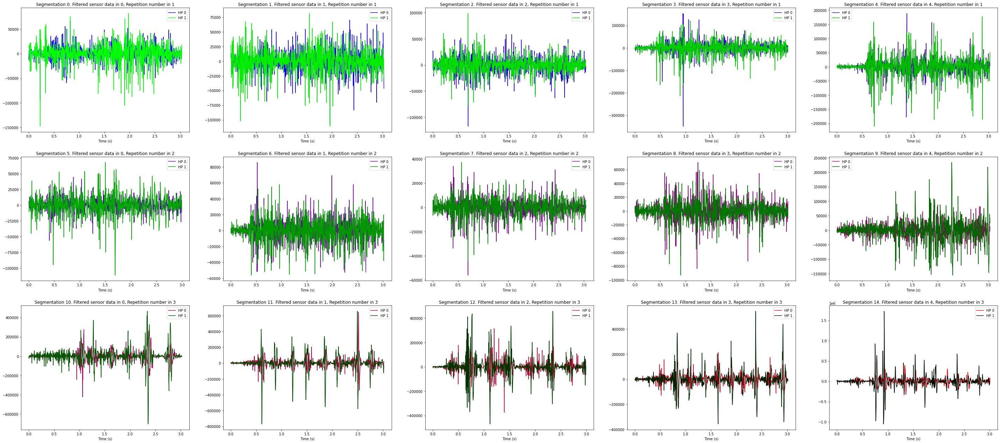

In [23]:
plt.figure(figsize = (50,30))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1)
    col1 = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]]
    col2 = [0, (seg_df.shape[0] - ii)/seg_df.shape[0],0]
    vis_sensors_filt(seg_df.iloc[ii],ax_handle = ax_handle,color1 = col1, color2= col2)
    plt.title(f'Segmentation {ii}. Filtered sensor data in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')


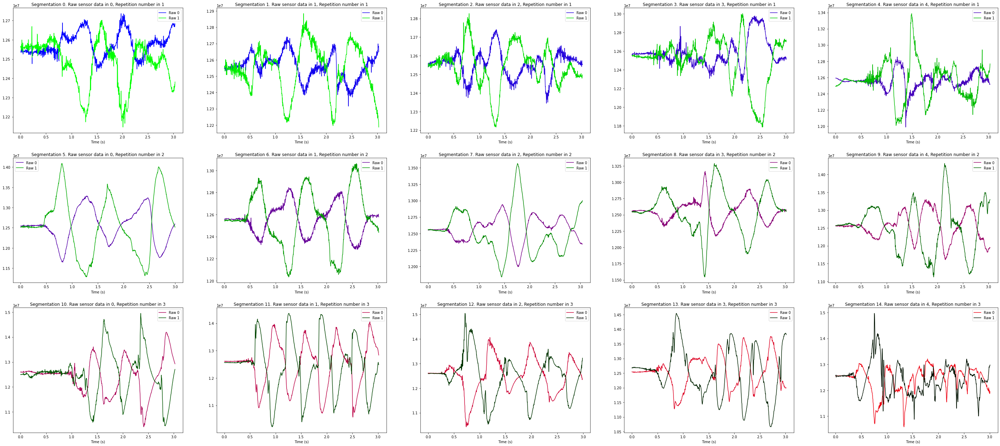

In [24]:
plt.figure(figsize = (50,30))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1)
    col1 = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]]
    col2 = [0, (seg_df.shape[0] - ii)/seg_df.shape[0],0]
    vis_sensors_raw(seg_df.iloc[ii],ax_handle = ax_handle,color1 = col1, color2= col2)
    plt.title(f'Segmentation {ii}. Raw sensor data in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')


## Sensor Traces Conclusions

* Raw traces we can see that that the major fluctuations come from the body motion, since there appears to be a high level of correlation to those motions.
* High passed data is incredibly noisy. My experience with neural data (I'm assuming this data is an EMG-sort of trace), ideally we apply a bandpass filter to get the meaningful information.

## Conclusions
* It appears that the sensors data have been turned on and off between recordings. So there is some time asynchornicity between periods.
* The sampling rate is estimated to be about 330 Hz. However, we have us precision, so either:\
    a) Data has been downsampled for efficency.\
    b) The sensors have some internal clock reference, but this would seem weird to have such level of precision for time.\
* Each period, which is a segment of time that the sensor was continuously turned on, corresponds to a specific motion and lasted ~3 seconds.



It's difficult to determine whether each segment of time is a gesture. Not only that, but a different gesture could be implemented for the same body position at a different trial.
This makes it hard to a:
1) Identify what is noise
2) Identify what segments of time can actually be combined
3) Identify what length of time is appropriate (i.e., multiple gestures per same body motion)

<b><u>However</b></u>, looking at the accelerometer traces, we see some periodic traces, so perhaps we can try splitting across those periods. We can then use the quaternion dataset to group the gestures.

## Hypothetical modifications
If I was an engineer/scientist on this project, I would clarify the following aspects:
1) Identify <i>where</i> the sensors are placed. Wrist? Fingers? 
2) Quaternion data: There appears to be 2 kinds, [rotation quaternions and orientation quaternions](https://en.wikipedia.org/wiki/Quaternions_and_spatial_rotation#:~:text=When%20used%20to%20represent%20rotation%2C%20unit%20quaternions%20are%20also%20called%20rotation%20quaternions%20as%20they%20represent%20the%203D%20rotation%20group.%20When%20used%20to%20represent%20an%20orientation%20(rotation%20relative%20to%20a%20reference%20coordinate%20system)%2C%20they%20are%20called%20orientation%20quaternions%20or%20attitude%20quaternions). Which kind of data do we have?

I would also create some experimental procedures:
1) One gesture per segment of time/body positioning, same number of repetitions of gestures per segments.

## Variable Segmentation

* Let's split the data based on accelerometer traces, and plot the quaternion data.
* Going to do this by finding the peaks in the accelerometer traces.


In [25]:
def estimate_accelerometer_power(df,accel_cols = ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)']):
    """Compute the magnitude of all the vectors provided (applied to the accelerometer data)

    Args:
        df (pandas.DataFrame): Contains the accelerometer components to aggregate
        accel_cols (list, optional): Column names for the accelerometer components. Defaults to ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'].

    Returns:
        pandas.DataFrame: Original dataframe with a new columne "Accelerometer_power"
    """
    df['Accelerometer_power'] = df.apply(lambda row: np.sqrt(sum(row[i]**2 for i in accel_cols)),axis =1)
    return df

In [26]:
def segment_based_on_periods(seg_df,heights = 14,async_indx = [],accel_cols = ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)']):
    """_summary_

    Args:
        seg_df (pandas.dataFrame): _description_
        heights (int, optional): _description_. Defaults to 14.
        async_indx (list, optional): _description_. Defaults to [].
        accel_cols (list, optional): Column names for the accelerometer components. Defaults to ['Accelerometer x (m2/s)','Accelerometer y (m2/s)','Accelerometer z (m2/s)'].
    Returns:
        _type_: _description_
    """
    seg_df['Accelerometer_power'] = seg_df.apply(lambda row: np.sqrt(sum(row[i]**2 for i in accel_cols)),axis =1)

    segment_pts = []
    for ii in range(seg_df.shape[0]):
        ind,_ = find_peaks(seg_df.loc[ii,'Accelerometer_power'],height = heights)   
        per = np.max(np.abs(np.diff(ind)))
        first_pt = ind[0]
        samp_pts = np.arange(first_pt,len(seg_df.loc[ii,'Accelerometer_power']),per)

        if len(async_indx): 
            samp_pts = async_indx[ii] + samp_pts
        
        segment_pts.extend(samp_pts)

    return segment_pts
        

In [27]:
tmp_df = estimate_accelerometer_power(tmp_df)
tmp_df = reset_time(tmp_df)
seg_df = segment_data(tmp_df,async_indx,1e10)
seg_pts = segment_based_on_periods(seg_df,async_indx = async_indx)

Text(0.5, 1.0, 'Accelerometer power trace with the peaks found')

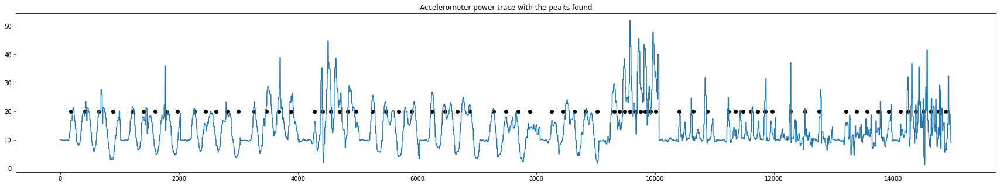

In [28]:
plt.figure(figsize = (30,5))

plt.plot(tmp_df['Accelerometer_power'])
plt.scatter(seg_pts,20*np.ones(len(seg_pts)),color = 'k')
plt.title('Accelerometer power trace with the peaks found')

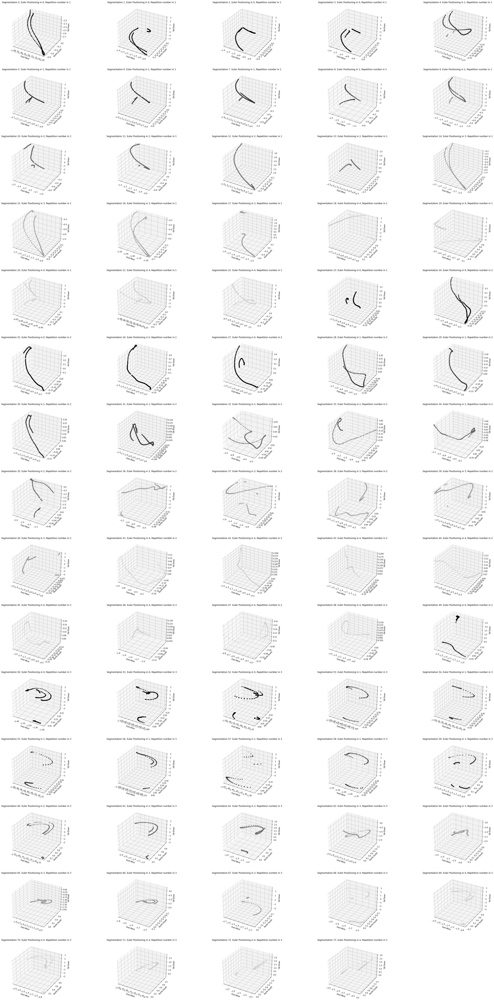

In [29]:
seg_df = segment_data(tmp_df,seg_pts,1e10)

plt.figure(figsize = (50,100))

for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1,projection = '3d')
    color = seg_df.loc[ii,'Body movement label']
    vis_euler3D(seg_df.iloc[ii],ax_handle = ax_handle,color = [color/5, color/5, color/5])
    plt.title(f'Segmentation {ii}. Euler Positioning in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')

Segmenting and visualizing the euler positions based on those peaks we can see some simple traces across all segmentations, with less repetitions than we saw previously when segmenting based on whole body movements.

However, when we find the peaks we are naturally just grabbing the "peak of the action/movement", so how about we shift back our peaks by a bit to see if we an capture the beginning of the action/movement.

In [30]:
#shifts = [25, 50, 100]
#
#for s in shifts:
#
#    seg_df = segment_data(tmp_df,np.array(seg_pts) - s,1e10)
#
#    plt.figure(figsize = (50,100))
#
#    for ii in range(seg_df.shape[0]):
#        ax_handle = plt.subplot(seg_df.shape[0]//5 + 1,5,ii+1,projection = '3d')
#        color = seg_df.loc[ii,'Body movement label']
#        vis_euler3D(seg_df.iloc[ii],ax_handle = ax_handle,color = [color/5, color/5, color/5])
#        plt.title(f'Segmentation {ii}. Euler Positioning in {seg_df.loc[ii,"Body movement label"]}, Repetition number in {seg_df.loc[ii,"Repetition number"]}')
#        plt.suptitle(f'peaks shifted back by {s} samples')

Hard to really assess patterns through visualizing this, so let's instead use a different approach. We can use clustering techniques to see if we can see things better.

# Some Initial Data Augmentation
 * Estimate the spectral power of different vectors (need sampling rate)
 * Decompose time vectors into relevant aspects

In [31]:
def estimate_frequency_spectra(df,col,f_bins = 32):
    """Estimate the frequency spectra for a given column, keeping only the real values.

    Args:
        df (pandas.DataFrame): DataFrame containing the columns to analyze the power spectrum
        col (str): Name of column to analyze
        f_bins (int, optional): length of the fft. Defaults to 32.

    Returns:
        pandas.DataFrame: DataFrame with the new column containing the frequency spectra under "spectra_[column name]"
    """

    #Take the FFT, normalize power, and take the real component only.
    df['spectra_' + col] = df[col].apply(lambda x: np.real(fft(x,n = f_bins)/len(x)))
    return df
    

### Singular Spectrum Analysis 

Not very familiar with this technique, but looking into some libraries online for body analysis, I found this tool and might be interested to add as a feature. Why not? Should help us identify periodicity, and ideally separate out noise sources common across all gestures.

In [32]:
indx_jump = identify_async_indx(df)
seg_df = segment_data(df,indx_jump,segment_size = 1e10) #let's segment so we can create our different segment samples for SSA exploration

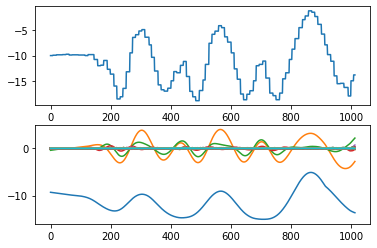

In [33]:
my_ssa = ssa(window_size= 100)
other_ssa = ssa(window_size = 100)
x = seg_df.loc[0,'Accelerometer y (m2/s)']

x_ssa  = my_ssa.fit_transform(x.reshape(1,-1))

plt.subplot(211);plt.plot(x)
plt.subplot(212)
for x_i in x_ssa:
    plt.plot(x_i)

One question that I have, is can I fit an SSA model to a trace and then re-transform other traces with this? From my understanding, given that this is a non-parameteric decomposition, it should be fine. However, mathematically it is dependent on the time series, so it might actually affect it. Let's test it just in case. 

Text(0.5, 1.0, 'Decomposed on another fit')

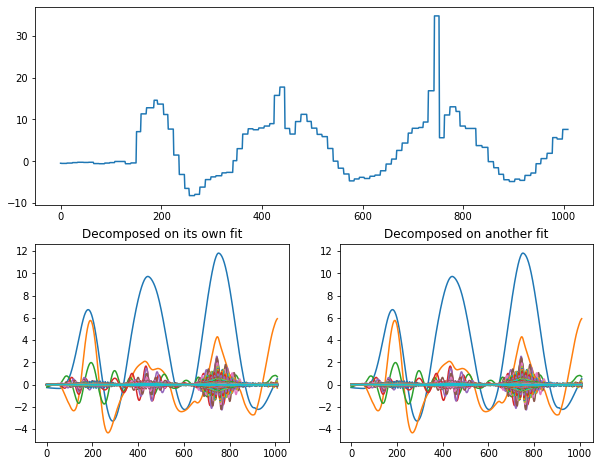

In [34]:
my_ssa = ssa(window_size= 100)
other_ssa = ssa(window_size = 100) #let's do a large number so that we could see the subtleties of the decomposition

x = seg_df.loc[0,'Accelerometer x (m2/s)'] #dataset that we will fit on
y = seg_df.loc[1,'Accelerometer x (m2/s)'] #dataset that we will only transform on

_ = my_ssa.fit(x.reshape(1,-1)) #fit on x 
y_o_ssa = my_ssa.transform(y.reshape(1,-1)) #transform on y
y_ssa = other_ssa.fit_transform(y.reshape(1,-1)) #fit and transform on y 

plt.figure(figsize = (10,8))
plt.subplot(211); plt.plot(y) #plot the original trace

plt.subplot(223);  
for y_i in y_ssa:
    plt.plot(y_i)
plt.title('Decomposed on it''s own fit')

plt.subplot(224)
for y_i in y_o_ssa:
    plt.plot(y_i)    
plt.title('Decomposed on another fit')

Let's implement it!

In [35]:
def cheap_ssa_analysis(df,col,num_wins = 3):
  """Super cheap way to implement SSA since we iterate as for-loops to assign the vectors.

  Args:
      df (pandas.DataFrame): DataFrame that contains information to decompose
      col (str): Column name to decompose.
      num_wins (int, optional): number of vectors to decompose into. Defaults to 3.

  Returns:
      pandas.DataFrame: DataFrame contained decomposed information
  """
  my_ssa = ssa(window_size = num_wins).fit(df.loc[0,col])
  tmp_out = df[col].apply(lambda x: my_ssa.transform(x.reshape(1,-1)))


  for this_win in range(num_wins):
    tmp = []
    for tmp_out_cell in tmp_out:
      tmp.append(tmp_out_cell[this_win])

    df[col + ' ssa_' + str(this_win)] = tmp

  return df

### Summary Statistics

Now let's turn our time series data into summary statistics

* Univariate statistics:

        mean
        std
        total power

* Bivariate statistics:

        Cross-correlation
                mean
                std
                lag
        Dynamic Time Warping

In [36]:
def univariate_analysis(df,col,stats = {'mean':np.mean, 'std':np.std, 'power' : (lambda x : np.sqrt(np.sum(np.abs(x)**2)))} ):
    """Perform a univariate statistical analysis on a given column

    Args:
        df (pandas.Dataframe): Contains the column to perform univariate analysis
        col (str): Column name
        stats (dict, optional): Statistics to perform on the column, with keys corresponding to the prefix for column names. Defaults to {'mean':np.mean, 'std':np.std, 'power':sqrt(sum(abs(x**2)))}.

    Returns:
        pandas.DataFrame: original dataframe containing new columns with the stats.
    """
    for name,func in stats.items():
        df[name + '_' + col] = df[col].apply(func)
    return df

In [37]:
def my_dtw(array_one,array_two,metric=euclidean):
    """Wrapper for fast dtw so that we only return the distance

    Args:
        array_one (np.array): signal one
        array_two (np.array): signal two
        metric (scip.spatial.distance, optional): Metric to use for DTW. Defaults to euclidean.

    Returns:
        float: Dynamic Time Wrapping distance
    """
    distance,_ = fastdtw(array_one,array_two,dist=metric)

    return distance

In [38]:
def bivariate_analysis(df,col1,col2,transforms = {'corr':correlate} , stats = {'mean' :np.mean, 'std':np.std, 'lag' :np.argmax} , joint_stat = {'fast_dtw':my_dtw}):
    """Perform bivariate analyses on sets of columns

    Args:
        df (pandas.Dataframe): Contains the column to perform univariate analysis
        col1 (str): Column name for feature 1
        col2 (str): Column name for feature 2
        transforms (dict, optional): Transformations to perform on joint series. Defaults to {'corr':correlate}.
        stats (dict, optional): Statistics to perform on the transformed series, with keys corresponding to the prefix for column names. Defaults to {'mean' :np.mean, 'std: np.std, 'lag' :np.argmax}.
        joint_stat (dict, optional): Statistics to perform on the joint series. Defaults to {'fast_dtw':my_dtw}.

    Returns:
        pandas.DataFrame: original dataframe containing new columns with the stats.
    """
    transform_dict = {}
    #We are going to transform groups of series into new time series components (i.e., correlation) and then perform certain stats on these transformations.
    #In order to not add new time-series components to our outputs, we are going to store these time series in a dictionary, then perform the stats on them and add
    #these stats to the dictionary. 
    for name,transf in transforms.items(): 
        dict_name = name + '_' + col1 + '_' + col2
        transform_dict[dict_name] =  df.apply(lambda row: transf(row[col1],row[col2]), axis = 1)


        for stat_name, func in stats.items():
            df[stat_name + '_' + dict_name] = transform_dict[dict_name].apply(func)

    #A few statistics depend on both series, so we will do this separately so we don't have to worry about adding more time series etc..
    for name,joint_func in joint_stat.items():
        df[name + '_' + col1 + '_' + col2] = df.apply(lambda row: joint_func(row[col1],row[col2]), axis = 1)
        
    return df

# Some Initial Clustering

Clustering here is tricky. 

1) Most clustering techniques for high-dimensional multivariable features work well for scalar values (UMAP, t-SNE, PCA, DBSCAN)
2) OR we can do time-series clustering but primarily for only univariable features, [ex1](https://www.kaggle.com/code/alejopaullier/clustering-time-series-with-tsne), [ex2](http://alexminnaar.com/2014/04/16/Time-Series-Classification-and-Clustering-with-Python.html), and do the same methods as above.
3) Multivariate time-series clustering appears to be newer research found a research paper on [m-tSNE](https://arxiv.org/pdf/1708.07942.pdf) [(github)](https://github.com/minhnguyen-cs/mtsne), or [EROS metric](https://infolab.usc.edu/DocsDemos/mmdb04.pdf), or [multivariate DTW](https://infolab.usc.edu/DocsDemos/mmdb04.pdf).

Because the IMU sensor has a 3-D mapping, I don't think that we can explore (2) for this data, (maybe for the HP sensor data). We can do (1) by creating data summary metrics. We can also do (3) with [DTW](https://tslearn.readthedocs.io/en/latest/gen_modules/metrics/tslearn.metrics.dtw_path.html).

In [39]:
m_df = df.copy()
other_cols = ['Time (ms)','Body movement label','Repetition number'] #columns that don't need to be processed 

#Full data preprocessing
m_df = reset_time(m_df)
indx_jump = identify_async_indx(m_df)


#Augument global data
m_df = quat_to_euler(m_df) #Let's add the Euler rotational parameters

#Normalize datasets if we are going to explore clustering in these domains
normalize_cols = ['Channel 0 Raw','Channel 1 Raw','Channel 0 HP','Channel 1 HP',
                  'Quaternion x','Quaternion y','Quaternion z','Quaternion w',
                  'Euler_x','Euler_y','Euler_z']
for col_name in normalize_cols:
    m_df = normalize_data(m_df,col_name) #normalize the data columns

#Segment Data for broad groups, add power, and add the new column to drop
seg_df = segment_data(m_df,indx_jump,segment_size= 1e10) #let's segment at a few samples
other_cols.append('num_samples') #new column that we can use for reference, but we don't want to perform any analysis on this

seg_pts = segment_based_on_periods(seg_df,async_indx = indx_jump) #let's 
seg_df = segment_data(m_df,seg_pts,1e10)
seg_df = estimate_accelerometer_power(seg_df) #estimate the accelerometer power

## Clustering in Multidimensional Scalar Datasets

Let's begin by summarizing all of our traces into scalar values 

Let's functionalize our data augmentation

In [190]:
def my_augmentation(in_df):
    """Combination of all the data augmentation so that we can repeat it later on more effectively.

    Args:
        df (pandas.DataFrame): DataFrame to turn into a feature matrix for KMeans by augmenting datasets
    
    Returns:
        (pandas.DataFrame, pandas.DataFrame,list) : DataFrame containing only the scalar values and features used for K means, Dataframe containing all of the summary stats and original values., list of columns to drop
    """

    df = in_df.copy()
    to_drop = ['Time (ms)','Channel 0 Raw','Channel 1 Raw',
        'Quaternion x','Quaternion y','Quaternion z','Quaternion w',
        'num_samples','Repetition number']

    ssa_cols = ['Channel 0 HP','Channel 1 HP','Accelerometer_power','Euler_x','Euler_y','Euler_z']
    freq_cols = ['Channel 0 HP','Channel 1 HP','Accelerometer_power']

    #Create Frequency components
    for col_name in ssa_cols:
        tmp_df = cheap_ssa_analysis(df,col_name)
    for col_name in freq_cols:
        tmp_df = estimate_frequency_spectra(tmp_df,col_name)    
    
    #Summarize time series data with univariate analysis
    stats = {'mean' : np.mean, 'std' : np.std, 'power' :  (lambda x : np.sqrt(np.sum(np.abs(x)**2)))}
    cols1 = ['Accelerometer x (m2/s)','Accelerometer y (m2/s)',
        'Accelerometer z (m2/s)','Gyroscope x (deg/s)','Gyroscope y (deg/s)',
        'Gyroscope z (deg/s)','Euler_x','Euler_y','Euler_z','Channel 1 HP','Channel 0 HP']
    for c in cols1:
        tmp_df = univariate_analysis(df,c,stats)


    #For the spectral analysis, only identify the power
    stats = {'power' :  (lambda x : np.sqrt(np.sum(np.abs(x)**2)))}
    cols2 = ['Euler_x ssa_0', 'Euler_x ssa_1', 'Euler_x ssa_2',
       'Euler_y ssa_0', 'Euler_y ssa_1', 'Euler_y ssa_2',
       'Euler_z ssa_0', 'Euler_z ssa_1', 'Euler_z ssa_2',
       'Channel 0 HP ssa_0', 'Channel 0 HP ssa_1', 'Channel 0 HP ssa_2',
       'spectra_Channel 0 HP', 'Channel 1 HP ssa_0', 'Channel 1 HP ssa_1',
       'Channel 1 HP ssa_2', 'spectra_Channel 1 HP',
       'Accelerometer_power ssa_0', 'Accelerometer_power ssa_1',
       'Accelerometer_power ssa_2', 'spectra_Accelerometer_power']
    for c in cols2:
        tmp_df = univariate_analysis(tmp_df,c,stats)

    cols_to_drop = to_drop + cols1 + cols2 + ['Accelerometer_power','Body movement label']
    X = tmp_df[tmp_df.columns.drop(to_drop).drop(cols1).drop(cols2).drop(['Accelerometer_power','Body movement label'])]
    
    return X,tmp_df,cols_to_drop

In [41]:
X,samp_df = my_augmentation(seg_df)

### TSNE

We can just visualize this high dimensional data in a lower dimensional state. 

In [42]:
Xtr = TSNE(n_components = 2, perplexity = 10).fit_transform(X)

Text(0.5, 1.0, 'Labelled with Repetition number')

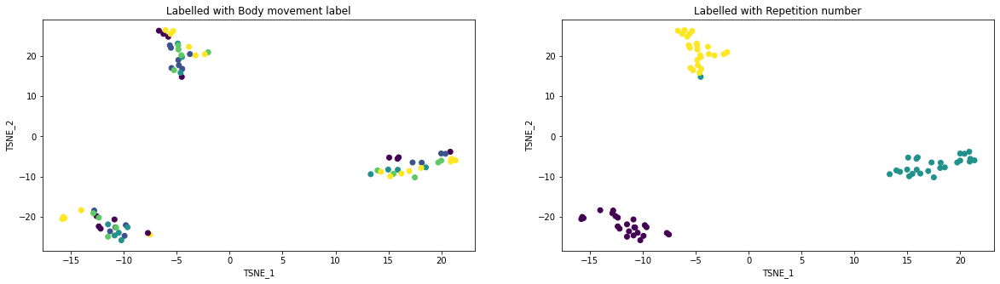

In [43]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.scatter(Xtr[:,0],Xtr[:,1],c = samp_df['Body movement label']); 
plt.xlabel('TSNE_1'); plt.ylabel('TSNE_2'); plt.title('Labelled with Body movement label')

plt.subplot(1,2,2)
plt.scatter(Xtr[:,0],Xtr[:,1],c = samp_df['Repetition number']); 
plt.xlabel('TSNE_1'); plt.ylabel('TSNE_2'); plt.title('Labelled with Repetition number')


Looks like There is significant influence from the repetition number when it comes to the TSNE grouping. We can see from the initial observations (Gyroscope Z, Sensor 0, Sensor 1, Accelerometer x) these parameters are influenced easily.

### PCA

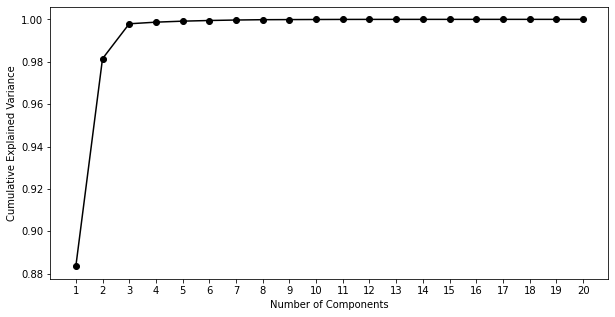

In [44]:
plt.figure(figsize = (10,5))
myax = plt.axes()

pca = PCA(n_components = 20 , svd_solver = 'arpack').fit(X)
plt.plot(range(1,21),np.cumsum(pca.explained_variance_ratio_),color = 'black', marker = 'o')
plt.setp(myax,xlabel = 'Number of Components',ylabel = 'Cumulative Explained Variance')
myax.set_xticks(range(1,21),labels=range(1,21))


Let's keep it at 4 components, since this explains the majority of the variance

In [45]:
Xtransform = PCA(n_components = 4 , svd_solver = 'arpack').fit_transform(X)

### K Means

In [46]:
def id_num_clusters(X_df,k_groups = np.arange(2,15),show = True):
    """Identify and visualize the distortion, silhouette score and inertia of clustering the data into various numbers of clusters.

    Args:
        X_df (pandas.DataFrame): DataFrame of features to cluster
        k_groups (np.array, optional): Array of number of clusters to visualize. Defaults to np.arange(1,15).
        show (bool, optional): To display the inertia, distortion and silhouette scores. Defaults to True.
    
    Returns:
        (list,list,list): distortion, inertia, and silhouette
    """
    inertia,distortion,silhouette = [],[],[]
    
    for k in k_groups:
        kmodel = KMeans(n_clusters = k,n_init = 'auto').fit(X_df)

        distortion.append(np.mean(cdist(X_df, kmodel.cluster_centers_,'euclidean')))
        inertia.append(kmodel.inertia_)
        silhouette.append(silhouette_score(X_df,kmodel.labels_))

    if show:
        plt.figure(figsize = (20,5))
        plt.subplot(131)
        plt.plot(k_groups,distortion,'--o'); plt.xlabel('Number of Clusters'); plt.ylabel('Distortion')
        plt.subplot(132)
        plt.plot(k_groups,inertia,'--o'); plt.xlabel('Number of Clusters'); plt.ylabel('Inertia')
        plt.subplot(133)
        plt.plot(k_groups,silhouette,'-o'); plt.xlabel('Number of Clusters'); plt.ylabel('Silhouette Score')

    return distortion, inertia, silhouette

Before we look at the transformed data in the PCA, let's just look at the untransformed data first.

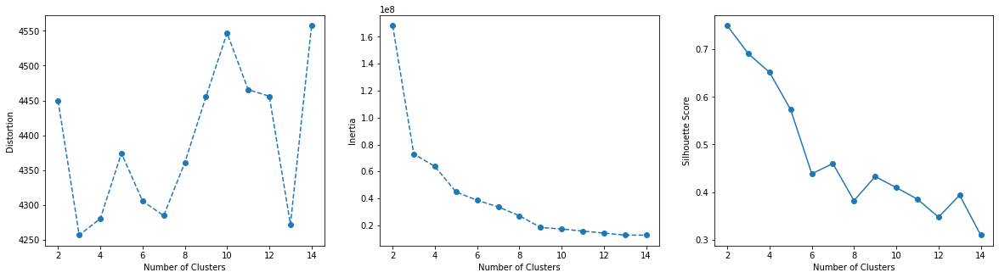

In [47]:
_,_,_ = id_num_clusters(X)

Mhm, difficult to interpret results, but my initial intuition looking at this makes me guess ~8 clusters. Looks alike at the inertia level we have a decrease from here, we also have a peak on the silhouette score.

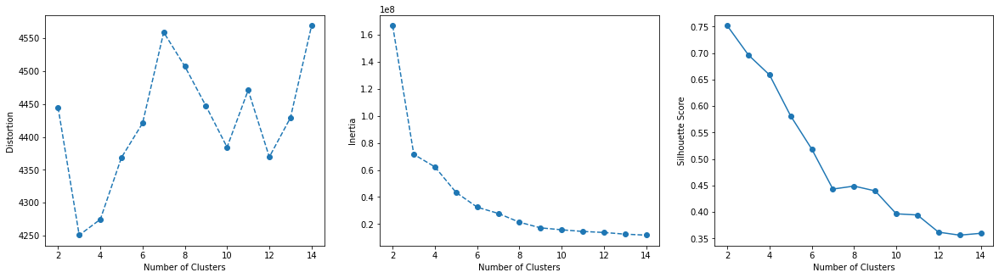

In [56]:
_,_,_ = id_num_clusters(Xtransform)

This is all over the place. Perhaps the inertia hints at 7/8 clusters, but the silhouette score is difficult to interpret. Maybe again, a peak around 7.

### In Depth Exploration

Looking at the initial clustering, let's see if we can improve the performace. Once we can have these labels we can build our classifier to identify, but let's see if we can get just a bit better outcomes.

Game plan:
1) Look at silhouette score/inertia score for different time segmentations and see if we can find a peak height/shift that maximizes the score as much using the KMeans metric of our custom DTW distance. Once we have something good here, we can apply the timeseriesKMeans since it's computationally expensive, to really flesh it out.

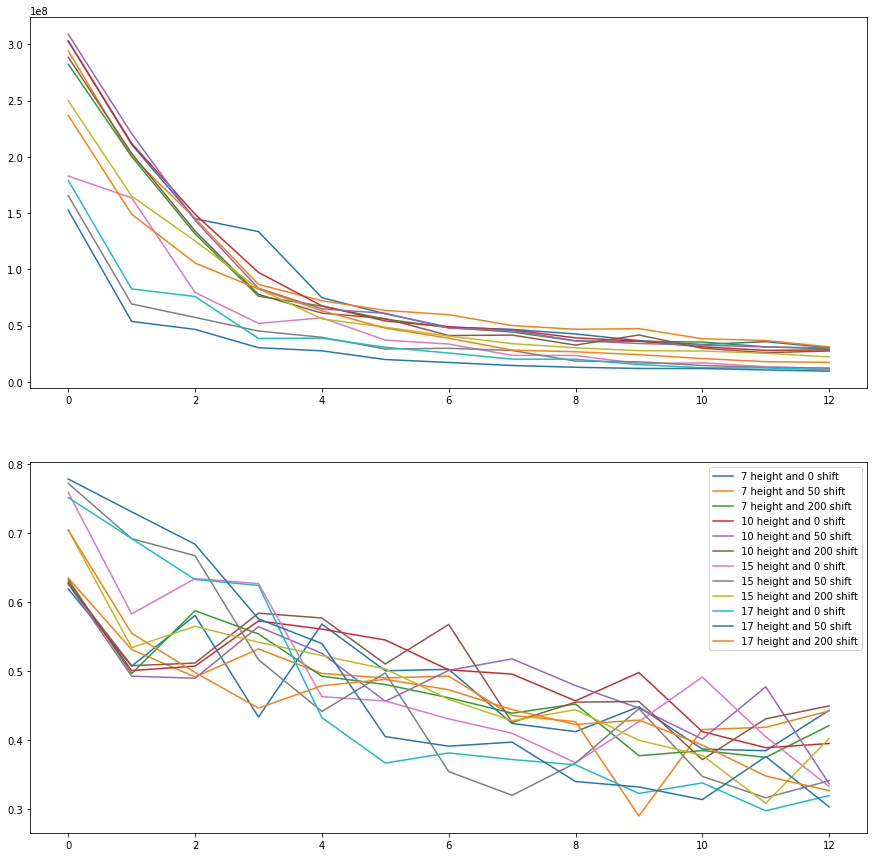

In [57]:
heights = [7,10,15,17]
shifts = [0,50,200]

samp_df = segment_data(m_df,indx_jump,segment_size = 1e10)

plt.figure(figsize = (15,15))
for t_h in heights:
    for th_s in shifts:
        seg_pts = segment_based_on_periods(samp_df,async_indx = indx_jump, heights = t_h)
        tmp_seg =segment_data(m_df,np.array(seg_pts)- th_s,1e10)
        tmp_seg = estimate_accelerometer_power(tmp_seg)

        X_f,_ = my_augmentation(tmp_seg)
        _,td,ts = id_num_clusters(X_f,show = False)

        
        plt.subplot(211); plt.plot(td,label = f'{t_h} height and {th_s} shift')
        plt.subplot(212); plt.plot(ts,label = f'{t_h} height and {th_s} shift')
plt.legend()


Based on these clustering groups, I think we have somewhere between 6-8 gestures, so let's look at our multidimentional clustering and look at the labelling. In terms of segmentation, a height of 10, and shift of 200 might show the best increase in silhouette score.

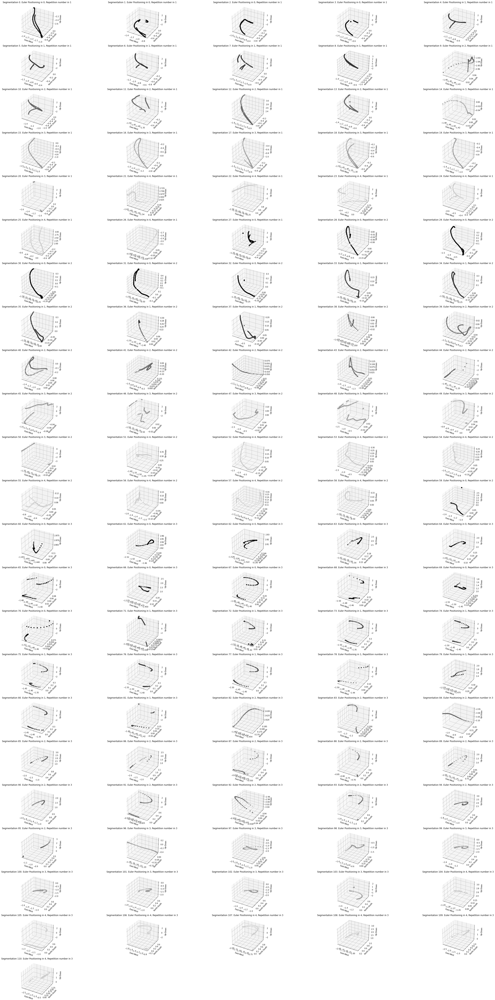

In [58]:
seg_pts = segment_based_on_periods(samp_df,async_indx = indx_jump, heights = 10)
samp_df = segment_data(tmp_df,np.array(seg_pts)-200,1e10)

plt.figure(figsize = (50,100))

for ii in range(samp_df.shape[0]):
    ax_handle = plt.subplot(samp_df.shape[0]//5 + 1,5,ii+1,projection = '3d')
    color = samp_df.loc[ii,'Body movement label']
    vis_euler3D(samp_df.iloc[ii],ax_handle = ax_handle,color = [color/5, color/5, color/5])
    plt.title(f'Segmentation {ii}. Euler Positioning in {samp_df.loc[ii,"Body movement label"]}, Repetition number in {samp_df.loc[ii,"Repetition number"]}')

## Clustering in Multidimensional Euclidean Positioning

In [59]:
def Coalesce_Euler3D(df,as_list = True):
    """Function to combine the Euler Trace

    Args:
        df (pandas.DataFrame): DataFrame containing the information for the euler traces spread out.
        as_list (bool, optional): Return values within each cell as a list instead of a np.array. Default True.

    Returns:
        pandas.DataFrame: DataFrame with the combined Euler trace as "Euler Series"
    """
    df['Euler Series'] = df.apply(lambda row: _combine_cols(row['Euler_x'],row['Euler_y'],row['Euler_z'],as_list = as_list),axis = 1)
    return df

def _combine_cols(x_data,y_data,z_data,as_list = True):
    """Combine columns into a single list for using of the dtw algorithms

    Args:
        x_data (np.array): Euler trace for the x direction
        y_data (np.array): Euler trace for the y direction
        z_data (np.array): Euler trace for the z direction
        as_list (bool, optional): Return values within each cell as a list instead of a np.array. Default True.

    Returns:
        list: list of tuples of the euler positioning
    """
    if as_list:
        out_col = [(i,k,j) for i,k,j in zip(x_data,y_data,z_data)]
    else:
        out_col = [np.array([i,k,j]) for i,k,j in zip(x_data,y_data,z_data)]
    return out_col

In [60]:
def dtw_matrix(df,col = 'Euler Series'):
    """Compute the DTW across all samples to generate a distance matrix 

    Args:
        df (pandas.DataFrame): DataFrame to compute the DTW distance matrix

    Returns:
        np.array: matrix containing the distances across all samples.
    """
    dist_mat = []
    for i in range(df.shape[0]):
        tmp = []
        for j in range(df.shape[0]):
            _,dist = dtw_path(df.loc[i,col],df.loc[j,col])
            tmp.append(dist)
        dist_mat.append(tmp)
    return np.array(dist_mat)

In [61]:
seg_df = Coalesce_Euler3D(seg_df,as_list = False)
dist_mat = dtw_matrix(seg_df)

Let's look at the distribution of distances to see what kind of values and neighborhoods we are looking at. (useful for DBSCAN)

Text(0, 0.5, 'Count')

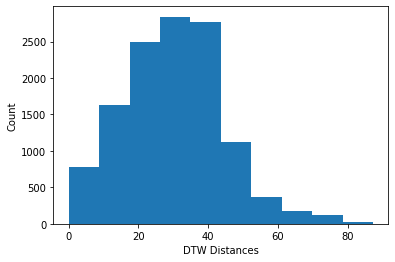

In [62]:
plt.hist(dist_mat.flatten())
plt.xlabel('DTW Distances'); plt.ylabel('Count')

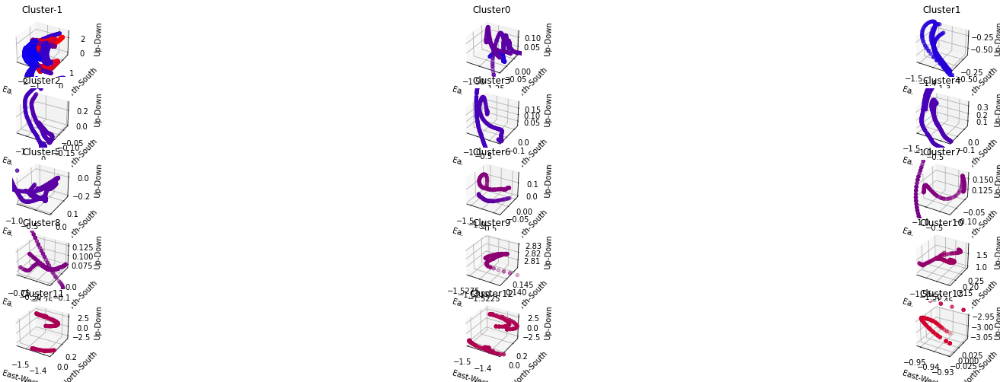

In [63]:
labels = DBSCAN(eps = 20, min_samples = 2).fit_predict(dist_mat)

plt.figure(figsize = (30,10))
for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(len(np.unique(labels))//3 + 1,3,labels[ii]+2,projection = '3d')
    vis_euler3D(seg_df.iloc[ii],ax_handle = ax_handle,color = [ii/seg_df.shape[0], 0, (seg_df.shape[0] - ii)/seg_df.shape[0]])
    plt.title(f'Cluster{labels[ii]}')


Doesn't appear that DTW clustering based on the Eucledian points helped enough. This could be an issue that we are pre-feeding the distance matrix. Let's try to implement TimeSeriesKMeans.

First, we based on the documentation [here](https://tslearn.readthedocs.io/en/stable/gen_modules/clustering/tslearn.clustering.TimeSeriesKMeans.html), we need to reformat the column to fit the right dimensions. On top of this, since we have different sized lengths we need to pad the missing arrays with nans. So let's incorporate the reformatting.

In [64]:
def format_column_for_timeseriesK(df,col):
    """Reformat a column to fit the dimensions and requisites of TimeSeriesKMeans.

    Args:
        df (pandas.DataFrame): DataFrame containing the column to reformat
        col (str): Column name to reformat.

    Returns:
        np.array: Array with the reformatted column following the structure required by TimeSeriesKMeans.
    """
    tmp_df = df.copy()
    max_samp = np.max(tmp_df.num_samples)
    tmp_df = tmp_df.apply(lambda row: _extend_time(row,col,max_samp),axis =1)
    return np.swapaxes(np.swapaxes(np.dstack(tmp_df[col]),1,2),0,1)



def _extend_time(row,col,max_samps,val = np.nan):
    """Subroutine called by format_column_for_timeseriesK to extend the vectors.

    Args:
        row (pandas.Series): Series containing num_samples and the vector that we wish to extend.
        col (str): column to extend
        max_samps (int): Value that we are extending up to.
        val (np.value, optional): Padding value. Defaults to np.nan.

    Returns:
        pandas.Series: Original series but with the 'col' component extended
    """
    extend_by = max_samps - row['num_samples']
    num_dim = len(row[col][0])

    if num_dim == 1:
        vect_extend = np.repeat(val,repeats = extend_by)
    else:
        vect_extend = np.tile(val,reps = [extend_by,num_dim])
    row[col].extend(vect_extend)
    return row

In [65]:
def id_num_time_series_clusters(X_df,k_groups = np.arange(2,10),show = True):
    """Identify and visualize the silhouette and inertia of clustering the data into various numbers of time series clusters.

    Args:
        X_df (pandas.DataFrame): DataFrame of features to cluster
        k_groups (np.array, optional): Array of number of clusters to visualize. Defaults to np.arange(1,15).
        show (bool, optional): To display the inertia, distortion and silhouette scores. Defaults to True.
    
    Returns:
        (list,list): inertia, and silhouette
    
    """
    inertia,silhouette = [],[]
    
    for k in k_groups:
        kmodel = TimeSeriesKMeans(n_clusters = k,init = 'random',metric = 'dtw',max_iter=5).fit(X_df)

        silhouette.append(ts_silhouette_score(X_df,kmodel.labels_))
        inertia.append(kmodel.inertia_)

    if show:
        plt.figure(figsize = (20,5))
        plt.subplot(121)
        plt.plot(k_groups,silhouette,'--o'); plt.xlabel('Number of Clusters'); plt.ylabel('Silhouette score')
        plt.subplot(122)
        plt.plot(k_groups,inertia,'--o'); plt.xlabel('Number of Clusters'); plt.ylabel('Inertia')

    return inertia, silhouette

After messing around a bit with Time Series K Means, it's imperative to use DTW as our metric because Euclidean does not return any valuable labels, so I have removed that from anoptional parameter. Let's just apply this multivariate time series clustering to a small subset of clusters that we identified with the scalar-based KMeans.

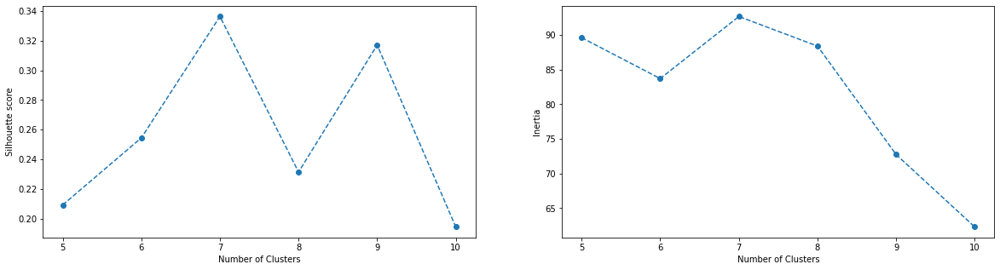

In [68]:
Xreformat = format_column_for_timeseriesK(samp_df,'Euler Series')
inert,silh = id_num_time_series_clusters(Xreformat,k_groups = np.arange(5,11))

## Putting it all together

Kind of hard to pin point based on the Time Series cluster, but let's go with 6 clusters since it showed promise in the other K Means approach.  Let's look at how our labeling compares and our scores.

In [185]:
seg_df = segment_data(m_df,indx_jump,1e10)
seg_pts = segment_based_on_periods(seg_df,async_indx = indx_jump,heights = 10) #let's 
seg_df = segment_data(m_df,np.array(seg_pts)-200,1e10)
seg_df = estimate_accelerometer_power(seg_df) #estimate the accelerometer power
X_f,aug_df,to_drop = my_augmentation(seg_df)
aug_df = Coalesce_Euler3D(aug_df)

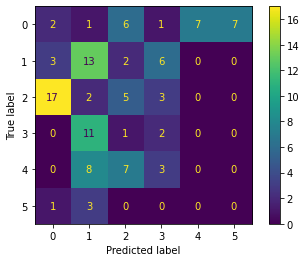

In [186]:
simple_k = KMeans(n_clusters = 6,n_init = 'auto').fit(X_f)
Xreformat = format_column_for_timeseriesK(aug_df,'Euler Series')
ts_k = TimeSeriesKMeans(n_clusters = 6,metric = 'dtw',max_iter=5).fit(Xreformat)

ConfusionMatrixDisplay(confusion_matrix(simple_k.labels_,ts_k.labels_)).plot()

Some important things to note: 
It's okay if we don't align in what the class is between the different clustering methods, as long as we always classify them in the same group (for exmaple, the normal k means labels 1 and 2 are pretty consistent and match well with the time series k means, even though the time series predicts other labels for them).

Let's just for fun run this at 7 clusters to see how this changes, since we had a high silhouette score.

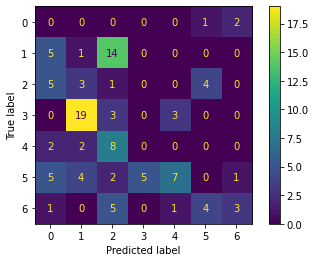

In [132]:
simple_k_7 = KMeans(n_clusters = 7,n_init = 'auto').fit(X_f)
ts_k_7 = TimeSeriesKMeans(n_clusters = 7,metric = 'dtw',max_iter=5).fit(Xreformat)

ConfusionMatrixDisplay(confusion_matrix(simple_k_7.labels_,ts_k_7.labels_)).plot()

Much wilder performance all across the space. We will stay with 6 as our clusters given the high silhouette scores and elbow-like inertia pivot points in the K Means analysis. 

Visualize the groupings of simple k Means

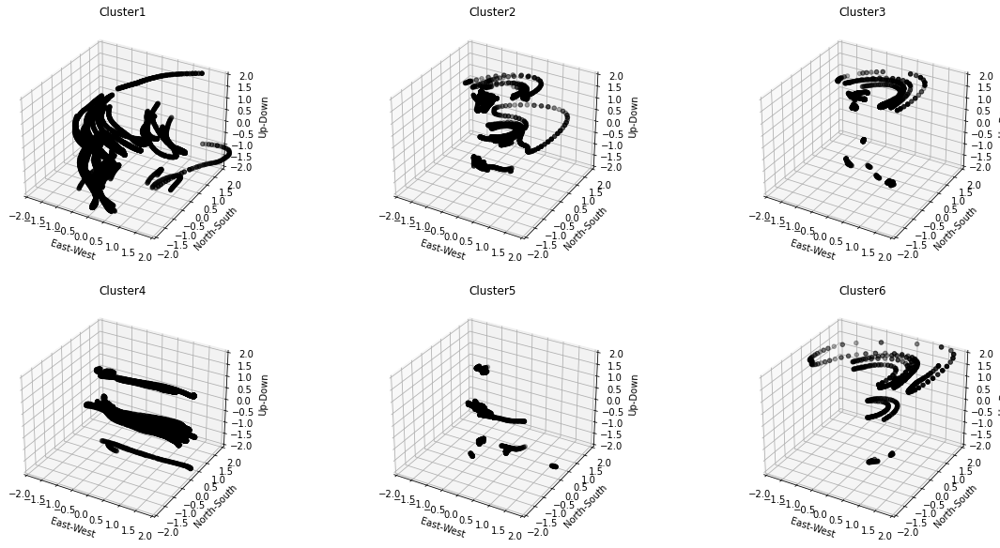

In [159]:
plt.figure(figsize = (20,10))
for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(2,3,simple_k.labels_[ii]+1,projection = '3d')
    vis_euler3D(aug_df.iloc[ii],ax_handle = ax_handle,color = 'black')
    plt.title(f'Cluster{simple_k.labels_[ii]+1}')

for ii in range(6):
    ax_handle = plt.subplot(2,3,ii+1,projection = '3d')
    plt.setp(ax_handle,xlim = [-2,2],ylim = [-2,2],zlim = [-2,2])

Visualize the Groupings of TS K Means

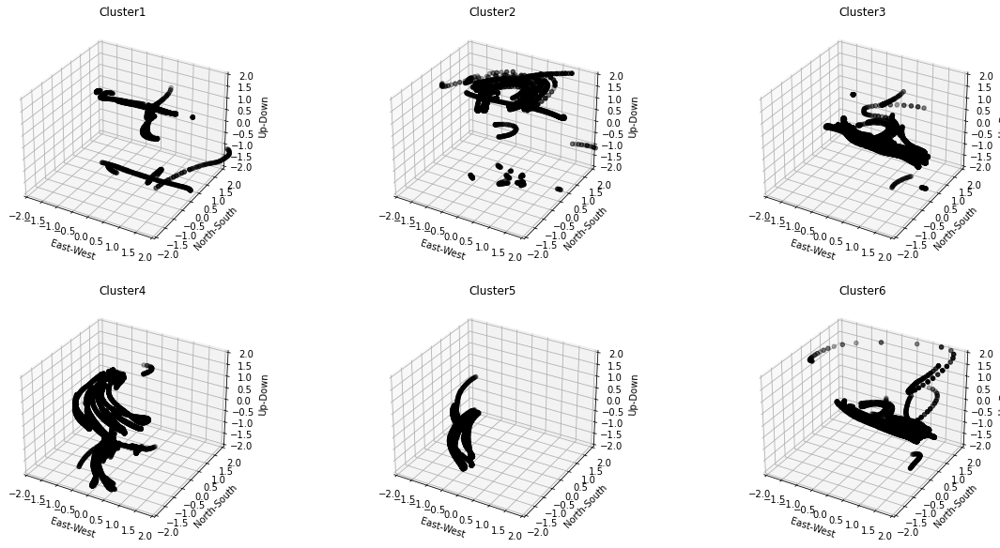

In [158]:
plt.figure(figsize = (20,10))
for ii in range(seg_df.shape[0]):
    ax_handle = plt.subplot(2,3,ts_k.labels_[ii]+1,projection = '3d')
    vis_euler3D(aug_df.iloc[ii],ax_handle = ax_handle,color = 'black')
    plt.title(f'Cluster{ts_k.labels_[ii]+1}')

for ii in range(6):
    ax_handle = plt.subplot(2,3,ii+1,projection = '3d')
    plt.setp(ax_handle,xlim = [-2,2],ylim = [-2,2],zlim = [-2,2])

# Classification

Steps:
1) Separate data into train/test datasets.
2) Create labels based on a K Means clustering algorithm. (Only on train set to avoid bleed).
3) Assign new labels on the test set

Text(0, 0.5, 'Gesture count')

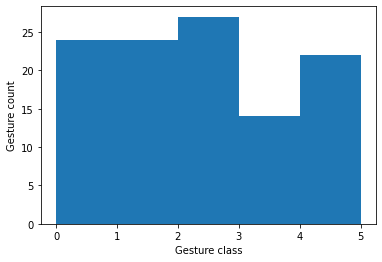

In [209]:
plt.hist(simple_k.labels_,bins = range(6)); plt.xlabel('Gesture class'); plt.ylabel('Gesture count')

Pretty uniform gesture distribution so we don't have to worry about class imbalance.

In [305]:
Xdf = aug_df[aug_df.columns.drop(to_drop).drop('Euler Series')]
X_train, X_test, y_train , y_test = train_test_split(Xdf,simple_k.labels_,test_size = 0.2,stratify = simple_k.labels_)


In [268]:
def score_model(model,features,labels):
    """Score out the tested model

    Args:
        model (model type): Object containing predict and predict_proba attributes
        features (pandas.DataFrame): Feature set of the testing dataset
        labels (list): Class id for the testing dataset

    Returns:
        float,float: f1 score and roc_score
    """
    preds = model.predict(features)
    f1= f1_score(labels,preds,average = 'macro')
    roc_score = roc_auc_score(labels,model.predict_proba(features),multi_class = 'ovr')

    print(f'f1 score: {f1}, roc_score: {roc_score}')
    return f1,roc_score


### Initial XGB Classifier using only the naive K Means

In [270]:
xgb = XGBClassifier().fit(X_train,y_train)

In [272]:
_,_ = score_model(xgb,X_test,y_test)

f1 score: 0.8396825396825397, roc_score: 0.9944444444444445


Text(0, 0.5, 'Gesture count')

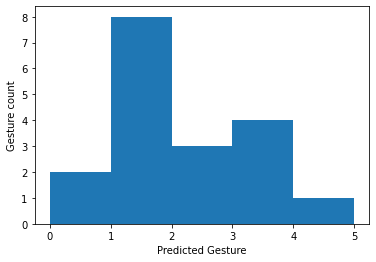

In [287]:
plt.hist(xgb.predict(X_test),bins = range(6)); plt.xlabel('Predicted Gesture'); plt.ylabel('Gesture count')

Really exciting to see such high performance for our models. The histogram gives us some peace of mind that it's not just simply predicting the same gesture over and over.


 Two other things to test before we finish: Let's look at how each gesture performs compared to the rest (One Vs All) and then use the labels of the time series data

In [306]:
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

In [323]:
y_bin = label_binarize(simple_k.labels_,classes = range(6))
X_train,X_test,y_train,y_test = train_test_split(Xdf,y_bin,test_size = 0.2)

In [324]:
multi_class = OneVsRestClassifier(XGBClassifier())
multi_score = multi_class.fit(X_train,y_train).predict(X_test)

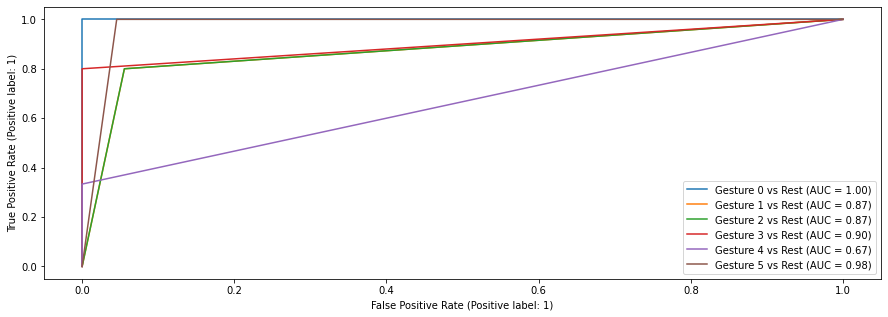

In [325]:
plt.figure(figsize = (15,5))
this_ax = plt.axes()
for cc in range(6):
    RocCurveDisplay.from_predictions(y_test[:,cc],multi_score[:,cc],name = f'Gesture {cc} vs Rest',ax = this_ax)

Interesting performance on the multiclass ROC performance. Gesture 4 has the lowest ROC score, but it's also the one we have the smallest sample number.

### XGB Classifier using Time Series K Means Labels

In [277]:
Xdf = aug_df[aug_df.columns.drop(to_drop).drop('Euler Series')]
X_train, X_test, y_train , y_test = train_test_split(Xdf,ts_k.labels_,test_size = 0.2)

In [278]:
xgb = XGBClassifier().fit(X_train,y_train)

In [280]:
_,_ = score_model(xgb,X_test,y_test)

f1 score: 0.784126984126984, roc_score: 0.9539473684210527


Much poorer performance in the f1 score and roc_score when training on the labels from the Time series K Means cluster.